# Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
from skimage import io
import cv2
from sklearn.model_selection import train_test_split, KFold
from sklearn.utils import shuffle
from scipy.io import loadmat

import tensorflow
from tensorflow import keras
from tensorflow import cast
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPool2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.metrics import AUC
from tensorflow.keras.applications import vgg16
from tensorflow.keras.applications import inception_v3
from tensorflow.keras.applications import inception_resnet_v2
from tensorflow.keras.applications import resnet_v2
from keras.utils.vis_utils import plot_model

import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score,f1_score, confusion_matrix
import gc
import os

# Mounting Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Image Pre-Processing

In [ ]:
IMAGE_HEIGHT=256
IMAGE_WIDTH=256
SAVE_MODEL_PATH = "/content/drive/MyDrive/CV/models/"
SAVE_FILE_PATH = "/content/drive/MyDrive/CV/model_plots/"

In [ ]:
x_train = np.load('/content/drive/MyDrive/CV/train_images.npy')
y_train = np.load('/content/drive/MyDrive/CV/train_labels.npy', allow_pickle=True)
x_test = np.load('/content/drive/MyDrive/CV/test_images.npy')
y_test = np.load('/content/drive/MyDrive/CV/test_labels.npy', allow_pickle=True)

In [ ]:
label_name = pd.read_csv('/content/drive/MyDrive/CV/label_names.csv', names=['classes'])
label_name = label_name.values[:, 0]

In [ ]:
freq = np.sum(y_train, axis=0)

In [ ]:
np.sum(y_train, axis=0), freq

(array([2479.,  122.,  477.,  147.,  136.,  156.,  134.,  246.,  108.,
         163.,  204.,  126.,  161.,  166.,  108.,   97.,  192.,  169.,
         256.,  163.,  116.,  166.,   99.,  110.,  135.,  134.,  137.,
         307.,  330.,  125.,  150.,  108.,  253.,  128.,  104.,  487.,
         164.,  183.,  151.,  426.,  122.,  161.,  132.,  115.,   93.,
         173.,   93.,  168.,  212.,  194.,  143.], dtype=float32),
 array([2479.,  122.,  477.,  147.,  136.,  156.,  134.,  246.,  108.,
         163.,  204.,  126.,  161.,  166.,  108.,   97.,  192.,  169.,
         256.,  163.,  116.,  166.,   99.,  110.,  135.,  134.,  137.,
         307.,  330.,  125.,  150.,  108.,  253.,  128.,  104.,  487.,
         164.,  183.,  151.,  426.,  122.,  161.,  132.,  115.,   93.,
         173.,   93.,  168.,  212.,  194.,  143.], dtype=float32))

In [ ]:
label_name.shape

(51,)

# Creating Neural Networks

In [ ]:
'''
function to get the head model for our model
can use VGG16, InceptionV3, ResNet152V2 or NAS Net Large
by default we will use pretrained weights from ImageNet dataset
'''
def getBaseModel(modelName, pretrained=True):
    if modelName == "VGG16":
        if pretrained:
            baseModel = VGG16(weights="imagenet", include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = VGG16(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    elif modelName == "InceptionV3":
        if pretrained:
            baseModel = InceptionV3(include_top=False, weights="imagenet", input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = InceptionV3(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    elif modelName == "ResNet152V2":
        if pretrained:
            baseModel = ResNet152V2(include_top=False, weights="imagenet", input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = ResNet152V2(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    elif modelName == "NasNetLarge":
        if pretrained:
            baseModel = NasNetLarge(include_top=False, weights="imagenet", input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = NasNetLarge(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    else:
        raise Exception("Model not supported.")

    return baseModel

In [ ]:
'''
function to generate the model
gets the desired base model from modelName
adds a dropout after flatten 
the last layer wull contain num_classes no. of units
denseUnits contain the list of units - (length of denseUnits is the no. of dense 
layers we want to add with value at each index signifying no. of units in each layer)
'''
def generateModel(modelName, pretrained=True, dropout=0.5, num_classes=51, denseUnits=[256]):
    baseModel = getBaseModel(modelName, pretrained)

    # the output of baseModel
    headModel = baseModel.output

    # Adding trainable layers in front
    headModel = Flatten(name="flatten")(headModel)
    headModel = Dropout(dropout)(headModel)
    for i in denseUnits:
        headModel = Dense(i, activation="relu")(headModel)

    # using sigmoid in last layer because output is multi-label
    headModel = Dense(num_classes, activation="sigmoid")(headModel)
    
    # Use pretrained weights
    if pretrained:
        for layer in baseModel.layers:
            layer.trainable = False
    model = Model(inputs=baseModel.input, outputs=headModel)
    fileName = SAVE_FILE_PATH + "model_plot_" + modelName + ".png"
    plot_model(model, to_file=fileName, show_shapes=True, show_layer_names=True)
    return model

In [ ]:
'''
function to train the model - uses Adam as optimizer and binary crossentropy as loss function
x, y - training data and labels
lrate - learning rate for Adam
batch_size - the size of the batch
epochs - no. of epochs
model - the model to train
modelName - the name of the model (for saving purposes)
class_weights - the weights for each class
earlyStopping - whether to use EarlyStopping callback or not
'''
def train(x, y, lrate, batch_size, epochs, model, modelName, class_weights, earlyStopping=True):
    optimizer = Adam(learning_rate=lrate)
    model.compile(optimizer=optimizer,
                    loss="binary_crossentropy",
                    metrics=[AUC(multi_label=True), keras.metrics.Precision(), keras.metrics.Recall()])
    
    #model save at checkpoint callback
    checkpoint = ModelCheckpoint(os.path.join(SAVE_MODEL_PATH, modelName), monitor= 'auc', mode= 'max', save_best_only=True, save_weights_only=True, verbose= 1)

    #early stopping callback
    if earlyStopping:
        es_cb = EarlyStopping(monitor='loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
        history = model.fit(x=x, y=y, epochs=epochs, class_weight=class_weights, batch_size=batch_size, verbose=1, callbacks=[es_cb])
    else:
        history = model.fit(x=x, y=y, epochs=epochs, class_weight=class_weights,batch_size=batch_size, verbose=1)
    
    keras.backend.clear_session()
    gc.collect()
    model.save_weights(os.path.join(SAVE_MODEL_PATH,"finalModel" + modelName + ".h5"))
    del model
    return history

In [ ]:
# Using ResNet12V2
x_train = resnet_v2.preprocess_input(x_train)
model = generateModel("ResNet152V2", dropout=0.60, num_classes=51, denseUnits=[256, 128])
model.summary()

234561536/234545216 [==============================] - 11s 0us/step
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.527165 to fit

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )            

In [ ]:
# class weights 
class_weights = {}
for i in range(y_train.shape[1]):
    # class weights = 1/sqrt(frequency of class)
    val = np.sum(y_train, axis=0)[i]
    class_weights[i] = 1/(np.sqrt(val))

# reducing the weight for person class
class_weights[0] *= 0.5
class_weights

{0: 0.010042266209236046,
 1: 0.09053574974745077,
 2: 0.04578685369346279,
 3: 0.08247861217552505,
 4: 0.08574929557377618,
 5: 0.08006407716136342,
 6: 0.08638684082287697,
 7: 0.0637576710393699,
 8: 0.09622504879958661,
 9: 0.07832604609047276,
 10: 0.07001400378896204,
 11: 0.08908708372542402,
 12: 0.07881103993118946,
 13: 0.07761505088432184,
 14: 0.09622504879958661,
 15: 0.10153461571086121,
 16: 0.07216878494400528,
 17: 0.07692307692307693,
 18: 0.0625,
 19: 0.07832604609047276,
 20: 0.09284767028564815,
 21: 0.07761505088432184,
 22: 0.1005037860391621,
 23: 0.09534625777831769,
 24: 0.08606629768227989,
 25: 0.08638684082287697,
 26: 0.08543576865067794,
 27: 0.05707301376358713,
 28: 0.05504819110632702,
 29: 0.0894427196941238,
 30: 0.08164965671085447,
 31: 0.09622504879958661,
 32: 0.06286946247717587,
 33: 0.0883883491610206,
 34: 0.09805806730288975,
 35: 0.045314324217711484,
 36: 0.07808687978582586,
 37: 0.0739221281713273,
 38: 0.08137884340678914,
 39: 0.04845

In [ ]:
# epochs, learning rate and batch-size for training
epochs = 40
lrate = 1e-3
batch_size = 32

history = train(x_train, y_train, lrate, batch_size, epochs, model, "ResNet152V2", class_weights, earlyStopping=False)

Epoch 1/40
141/141 [==============================] - 110s 624ms/step - loss: 0.0086 - auc: 0.6970 - precision: 0.3073 - recall: 0.2790
Epoch 2/40
141/141 [==============================] - 87s 619ms/step - loss: 0.0038 - auc: 0.8588 - precision: 0.6179 - recall: 0.4344
Epoch 3/40
141/141 [==============================] - 87s 620ms/step - loss: 0.0026 - auc: 0.9149 - precision: 0.7227 - recall: 0.5587
Epoch 4/40
141/141 [==============================] - 87s 620ms/step - loss: 0.0019 - auc: 0.9400 - precision: 0.7832 - recall: 0.6215
Epoch 5/40
141/141 [==============================] - 87s 620ms/step - loss: 0.0015 - auc: 0.9568 - precision: 0.8160 - recall: 0.6824
Epoch 6/40
141/141 [==============================] - 87s 618ms/step - loss: 0.0013 - auc: 0.9660 - precision: 0.8344 - recall: 0.7254
Epoch 7/40
141/141 [==============================] - 87s 618ms/step - loss: 0.0010 - auc: 0.9737 - precision: 0.8584 - recall: 0.7567
Epoch 8/40
141/141 [==============================] - 

# Testing and Metrics

In [ ]:
# the function to plot metrics
def plotMetrics(history):
    plt.plot(history["auc"])
    plt.plot(history["precision"])
    plt.plot(history["recall"])
    plt.title("Model Accuracy")
    plt.xlabel("epoch")
    plt.ylabel("metric")
    plt.legend(["AUC","Precision", "Recall"], loc="best")
    plt.show()

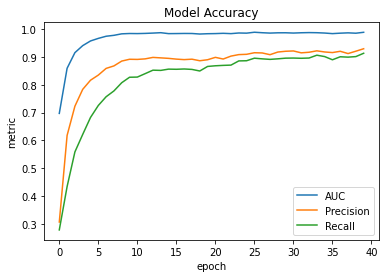

In [ ]:
plotMetrics(history.history)

In [ ]:
# function to get the label from prediction
# based on the confidence the prediction is made
def getLabels(preds, confidence):
  result = []
  for pred in preds:
    res = []
    for i, prob in enumerate(pred):
      # predicted probability should be greater than confidence value to include in final result
      if prob > confidence:
          res.append(label_name[i])
    result.append(res)
  return result

In [ ]:
# preprocessing the test data
test_pred = model.predict(resnet_v2.preprocess_input(np.array(x_test,dtype=np.float32)))

In [ ]:
# metrics obtained for test data
optimizer = Adam(learning_rate=lrate)
model.compile(metrics=[AUC(multi_label=True), keras.metrics.Precision(), keras.metrics.Recall()])
eval = model.evaluate(resnet_v2.preprocess_input(np.array(x_test,dtype=np.float32)), y_test)

16/16 [==============================] - 16s 612ms/step - loss: 0.0000e+00 - auc: 0.7630 - precision: 0.6292 - recall: 0.4988


In [ ]:
gc.collect()

5217

In [ ]:
# function to diplay results for training data, confidence set to 0.5
def show_result_train(idx, conf=0.5):
    plt.imshow(x_org[idx].astype(np.uint8))
    print(getLabels(train_pred, conf)[idx])

# function to diplay results for testing data, confidence set to 0.5
def show_result_test(idx, conf=0.5):
    plt.imshow(x_test[idx].astype(np.uint8))
    print(getLabels(test_pred, conf)[idx])

['person', 'baseball bat', 'baseball glove']


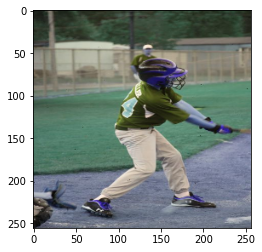

['person']


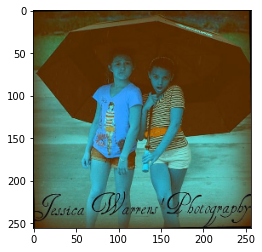

['person']


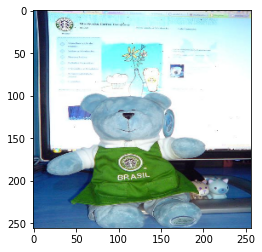

['person', 'book']


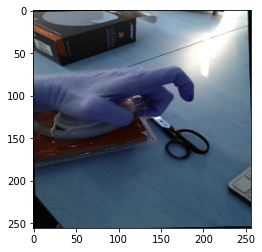

['person', 'bed']


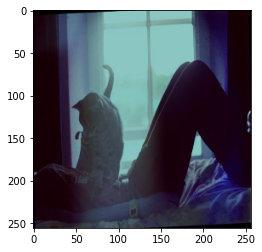

['horse']


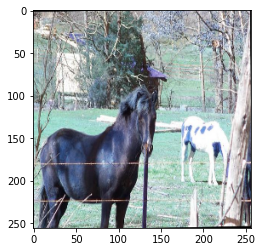

[]


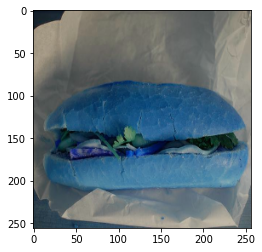

['person', 'handbag']


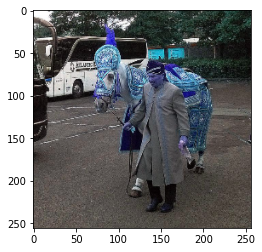

['airplane']


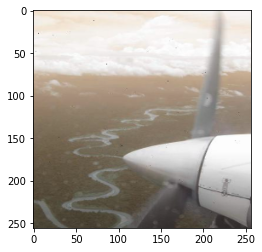

['cat']


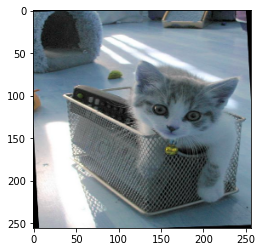

['person']


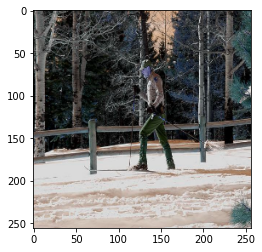

['person', 'backpack', 'bottle', 'cup', 'knife', 'pizza', 'dining table']


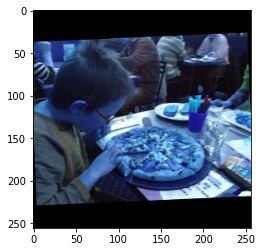

['train']


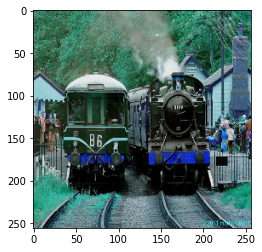

['person', 'tennis racket']


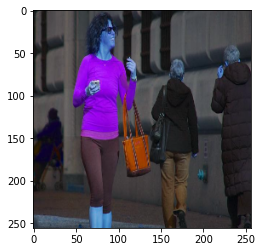

['person']


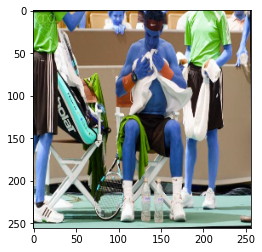

['person', 'motorcycle']


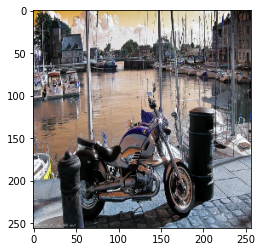

['person', 'backpack', 'pizza', 'chair']


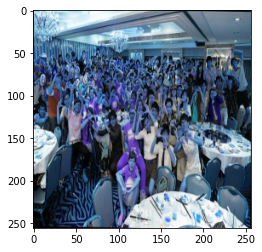

['car', 'bus']


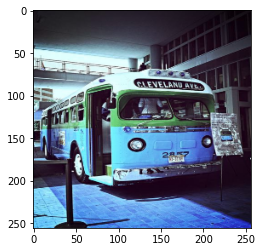

['person']


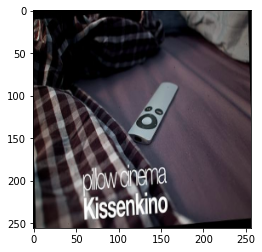

['toilet', 'sink']


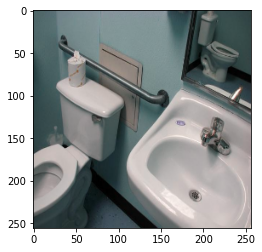

['person', 'cup']


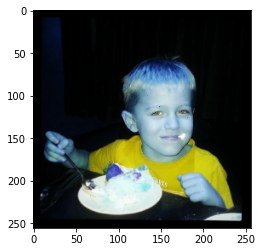

['person', 'surfboard']


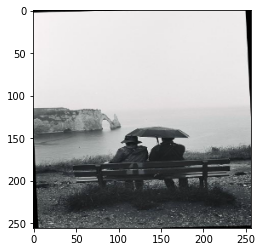

[]


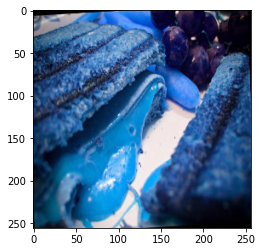

['chair', 'couch', 'tv', 'book', 'vase']


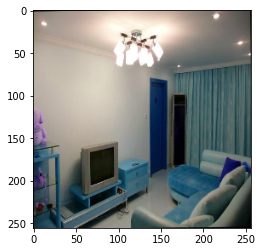

['bed', 'book']


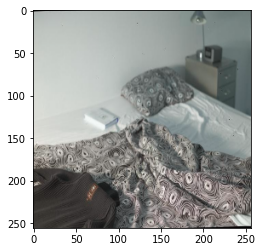

['person', 'sports ball', 'tennis racket']


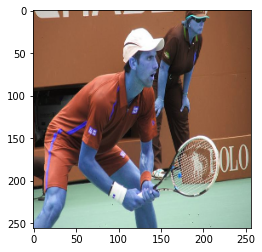

['person', 'chair', 'clock']


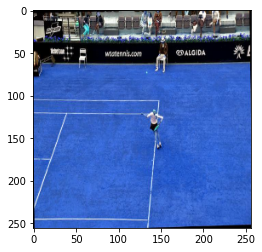

['person', 'chair', 'sink', 'clock']


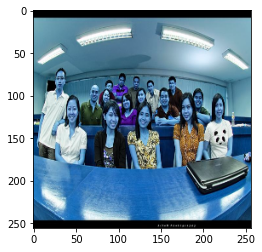

['giraffe']


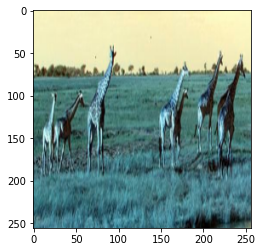

['person', 'sports ball']


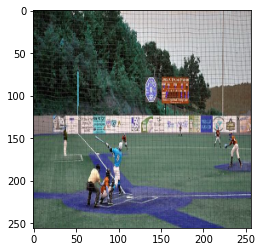

['person', 'backpack']


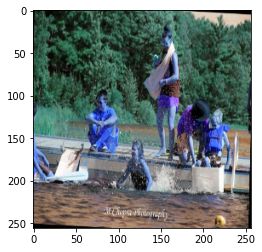

['person', 'bowl']


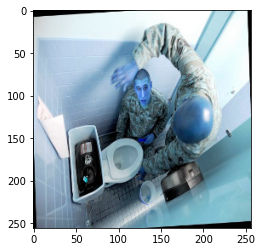

['person', 'truck']


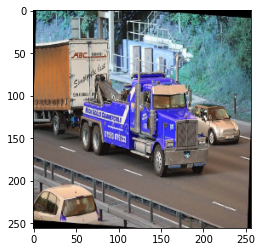

[]


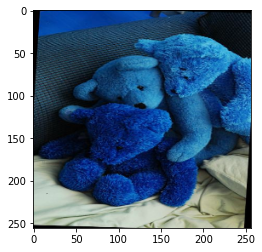

['person', 'boat', 'bench']


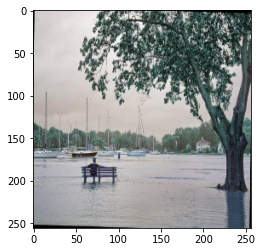

['person', 'dog']


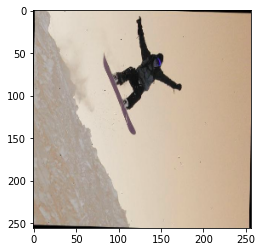

['person']


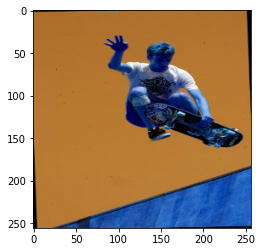

['person', 'bottle', 'cup', 'knife', 'pizza', 'dining table', 'sink']


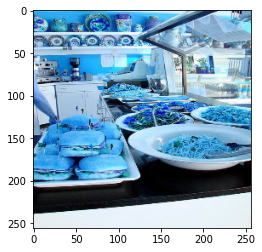

['person', 'boat']


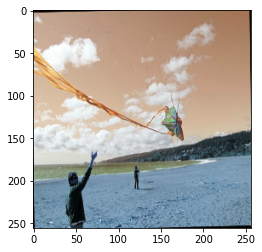

['person', 'bicycle', 'car', 'bus', 'truck', 'traffic light', 'backpack', 'umbrella']


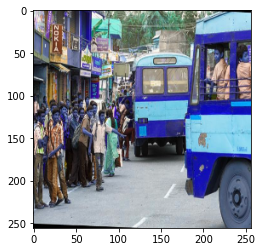

['person', 'cat', 'tv', 'book', 'clock']


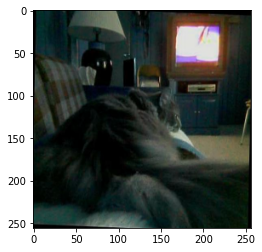

['person']


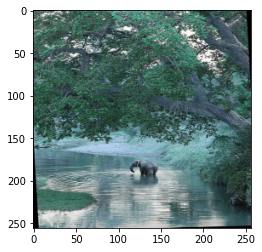

['person', 'car']


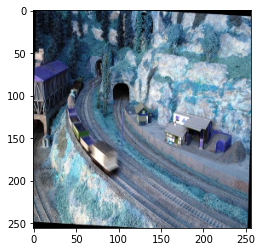

['person', 'bottle', 'cup', 'chair', 'dining table']


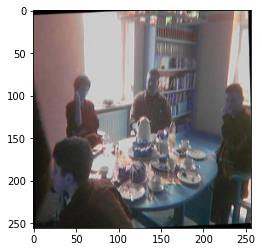

['person']


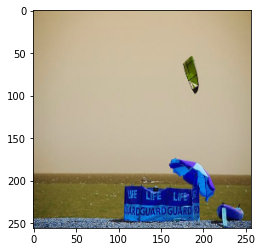

['person', 'surfboard']


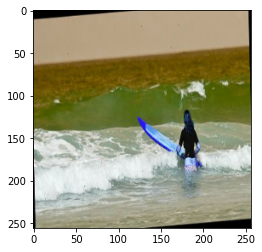

['person']


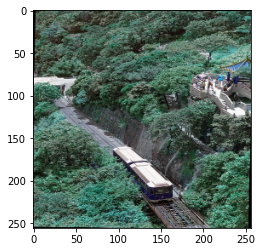

['bed', 'book']


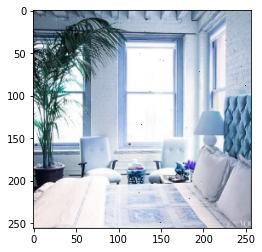

[]


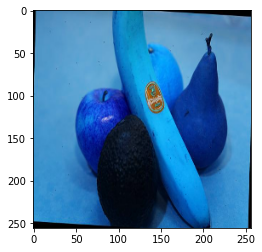

['person']


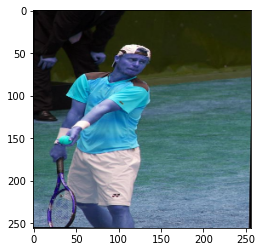

['cup', 'bowl']


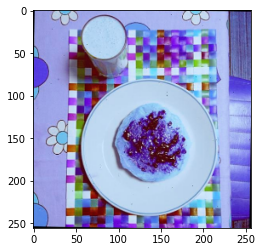

['person', 'motorcycle']


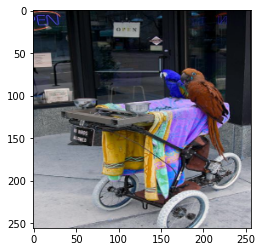

['bus']


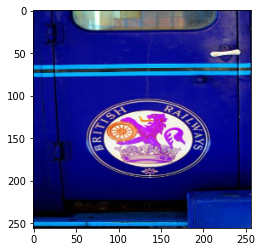

['person', 'motorcycle']


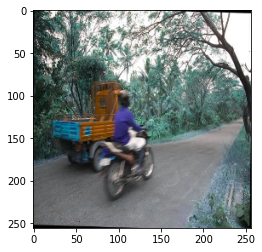

['person', 'bottle', 'cup', 'knife', 'chair', 'couch', 'dining table']


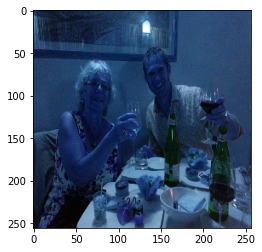

['bench']


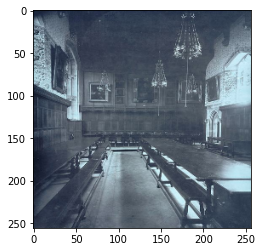

['person']


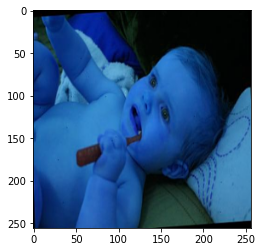

[]


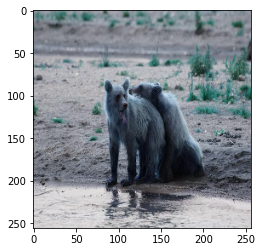

['person', 'car', 'truck', 'backpack']


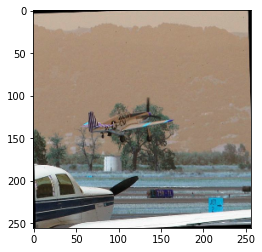

['couch', 'tv', 'oven', 'sink']


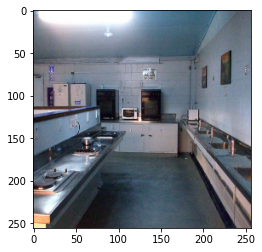

['traffic light']


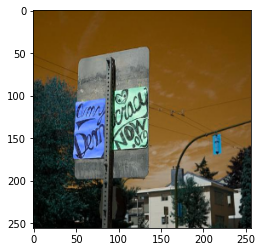

['person']


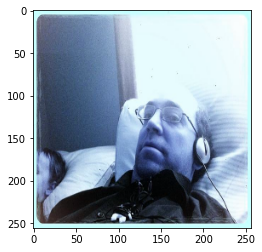

['person', 'couch', 'remote', 'book']


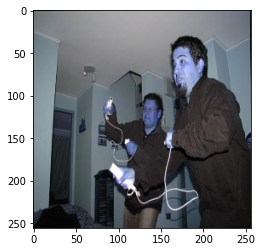

['person']


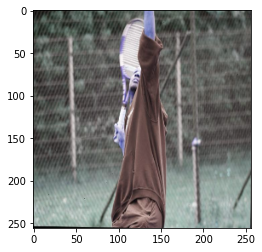

['boat']


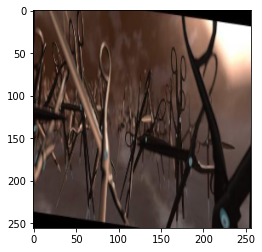

['person', 'surfboard']


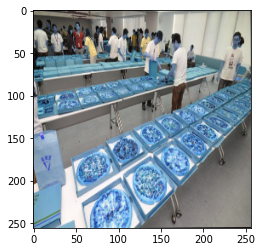

['person']


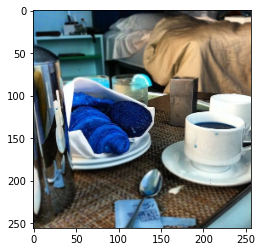

['dog']


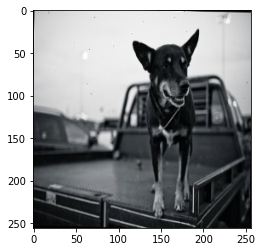

['person']


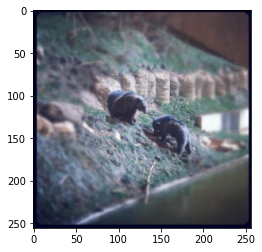

[]


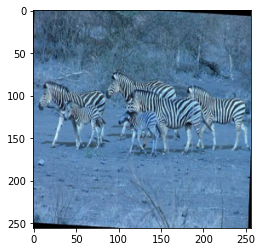

['person']


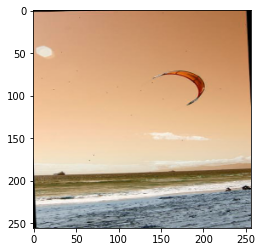

['cat']


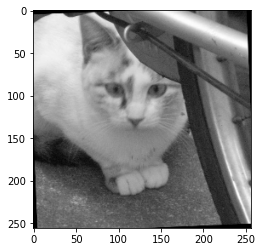

['laptop', 'book']


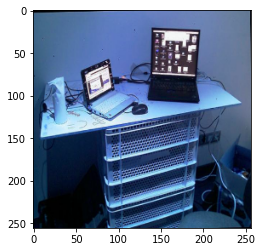

['cat']


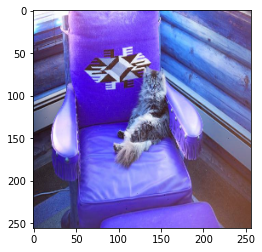

[]


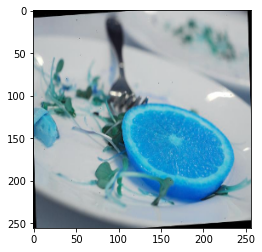

['person', 'cake']


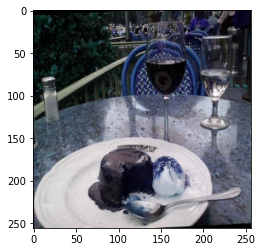

['cup']


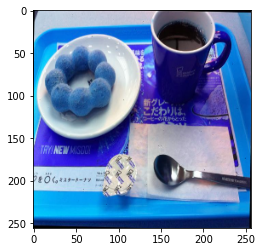

['person']


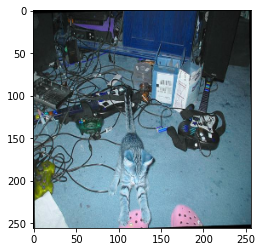

['person', 'chair', 'book']


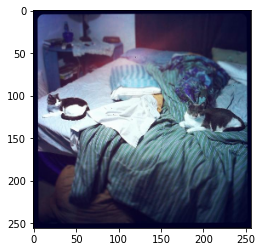

['person', 'bottle', 'couch', 'remote']


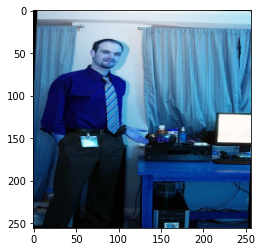

['vase']


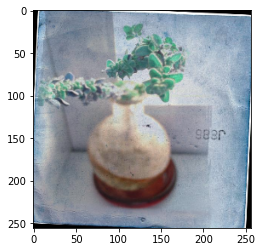

['person']


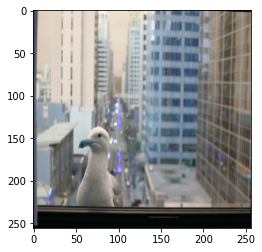

['person', 'remote']


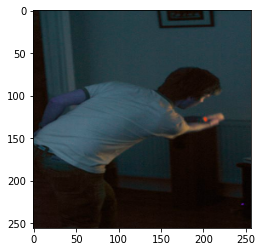

['clock']


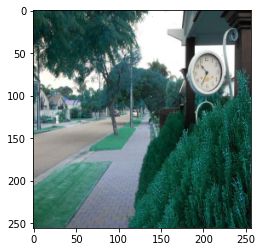

['bench']


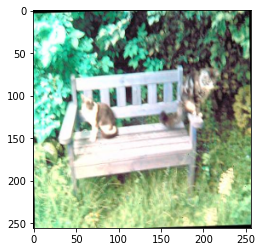

[]


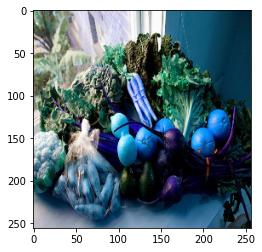

['person', 'skis']


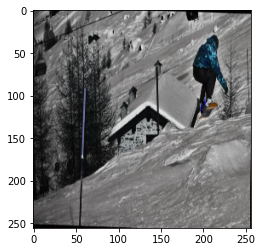

['person', 'tennis racket']


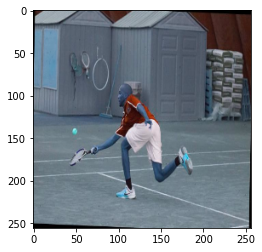

['person', 'cup', 'chair', 'dining table', 'book']


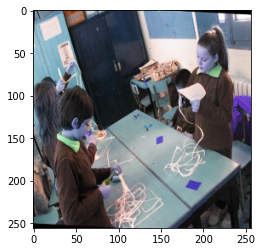

['toilet']


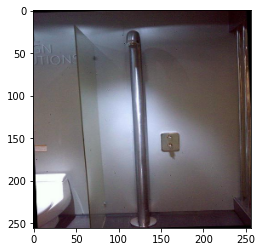

['person', 'car', 'bus']


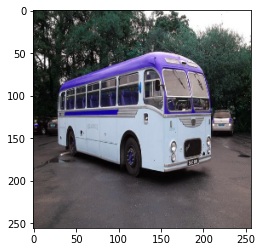

[]


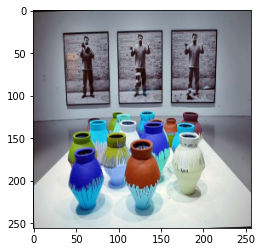

['truck']


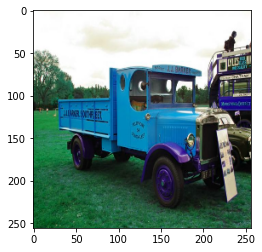

['train', 'boat']


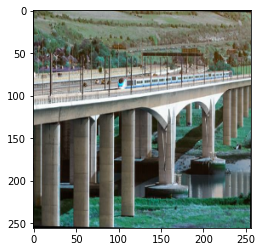

['person', 'surfboard']


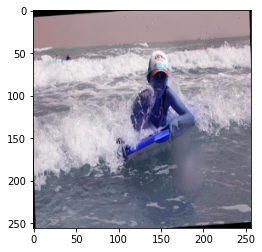

['person']


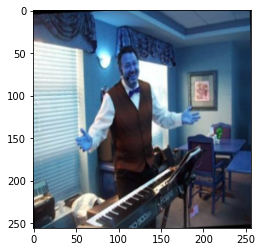

['person', 'car', 'train']


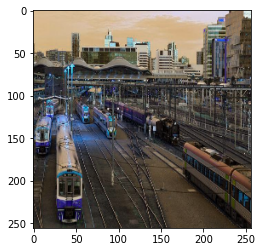

['person', 'tennis racket']


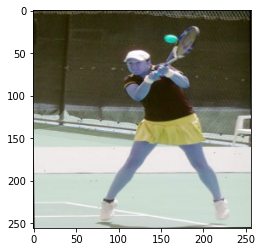

['person', 'baseball bat']


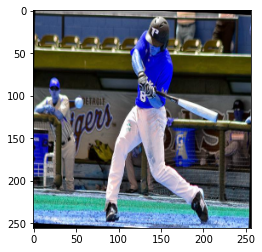

[]


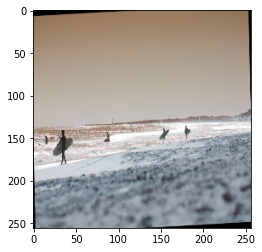

In [ ]:
import random
ran_nums = random.sample(range(500), 100)
for i in ran_nums:
  show_result_test(i)
  plt.show()

['sports ball']


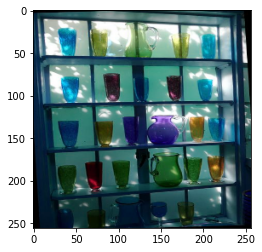

In [ ]:
show_result_test(5)

['person', 'bear', 'zebra', 'giraffe']


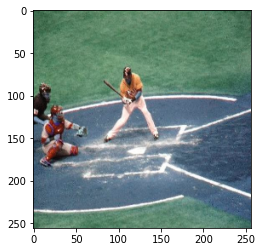

In [ ]:
show_result_test(11)

['bus', 'boat', 'orange']


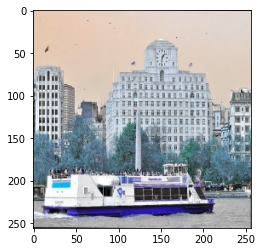

In [ ]:
show_result_test(53)

['person']


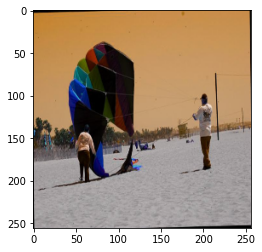

In [ ]:
show_result_test(16)

['person', 'cow']


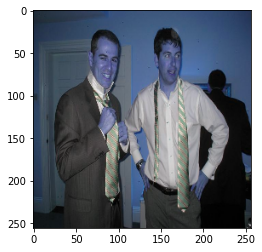

In [ ]:
show_result_test(56)

['person']


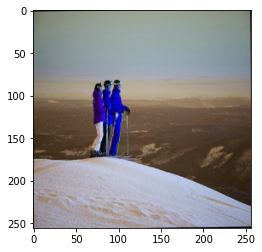

In [ ]:
show_result_test(510)

['person']


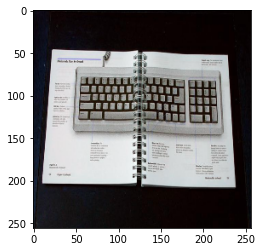

In [ ]:
show_result_test(940)

['person']


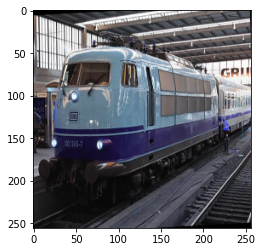

In [ ]:
show_result_test(612)

['person']


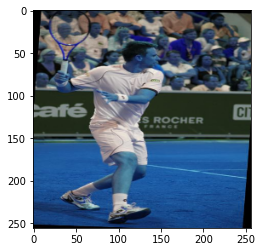

In [ ]:
show_result_test(150)